### Module 2

In [1]:
from pathlib import Path

parent_dir = Path().resolve().parent 
data_path = parent_dir/"data/module2"   
result_path = parent_dir/"results/module2" 
result_path.mkdir(exist_ok=True)

Ex2.1

- Load the complex data "kspace.npy" using the np.load() routine. Determine which array dimension is the coil dimension.

- Create an image of the magnitude of k-space for each coil. \
    You can use np.log1p() to scale the kspace data for easier visualisation.

k-space data shape: (6, 280, 280)


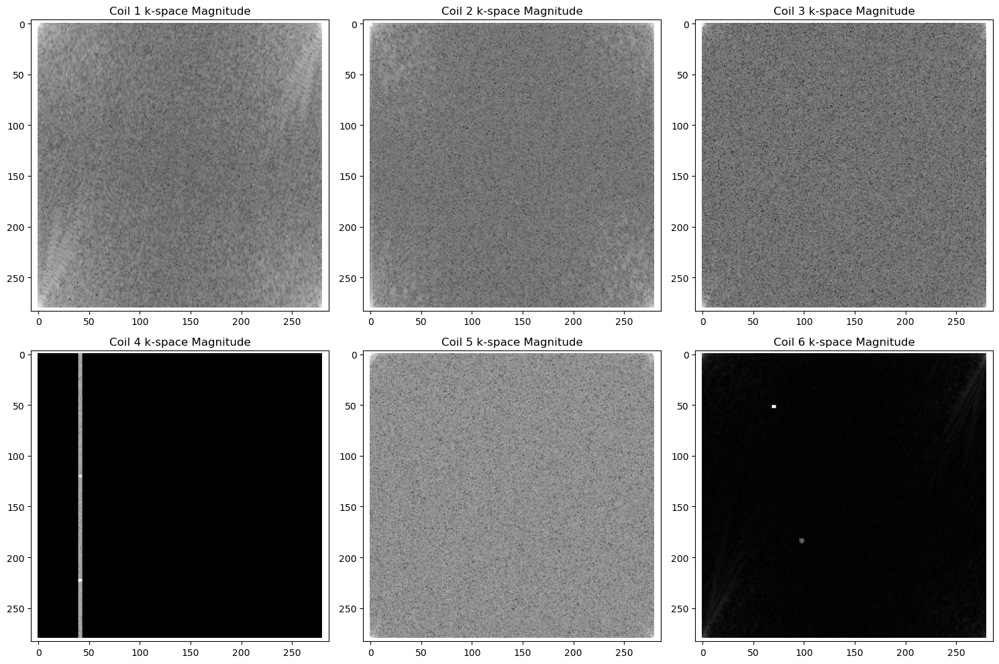

In [2]:
import numpy as np
import matplotlib.pyplot as plt

kdata = np.load(data_path/"kspace.npy")

print(f"k-space data shape: {kdata.shape}")

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i in range(kdata.shape[0]):
    coil = kdata[i, :, :]

    kmag = np.log1p(np.abs(coil))
    axes[i].imshow(kmag, cmap='gray')
    axes[i].set_title(f'Coil {i+1} k-space Magnitude')
    axes[i].axis('equal')

plt.tight_layout()
plt.show()


- Transpose the data into image space using the Fourier transform. Create and show a magnitude and phase image from one coil.

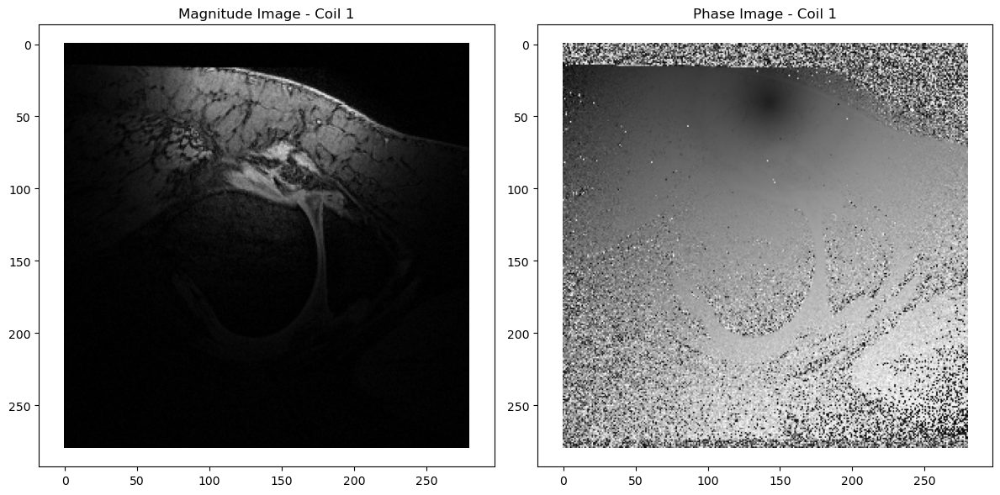

In [3]:
import numpy as np
import matplotlib.pyplot as plt

images = np.zeros_like(kdata, dtype=complex)

for i in range(kdata.shape[0]):
    images[i] = np.fft.ifft2(kdata[i])

# display magnitude and phase for the first coil
coil_image = images[0]

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# magnitude
axes[0].imshow(np.abs(coil_image), cmap='gray')
axes[0].set_title('Magnitude Image - Coil 1')
axes[0].axis('equal')

# phase
axes[1].imshow(np.angle(coil_image), cmap='gray')
axes[1].set_title('Phase Image - Coil 1')
axes[1].axis('equal')

plt.tight_layout()
plt.show()

- Show the magnitude images from all coils.

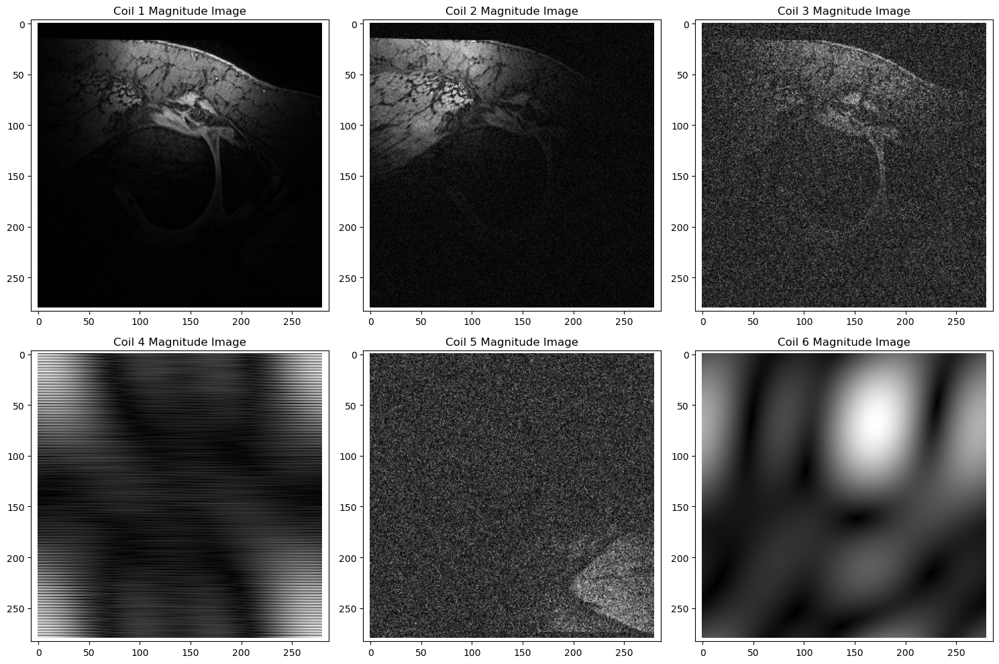

In [4]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i in range(kdata.shape[0]):
    coil_image = images[i, :, :]
    
    axes[i].imshow(np.abs(coil_image), cmap='gray')
    axes[i].set_title(f'Coil {i+1} Magnitude Image')
    axes[i].axis('equal')

plt.tight_layout()
plt.show()

- Choose and appropriate way to combine the data from all of the coils into a single image (in image space). \
Do this by squaring the image from each coil, summing the magnitude, and then taking the square root of the final result. Show this image.

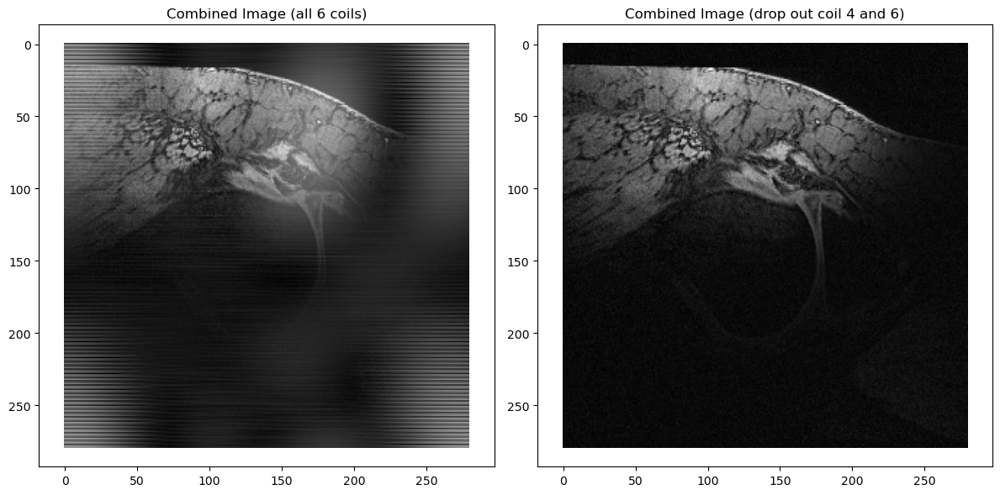

In [5]:
import numpy as np
import matplotlib.pyplot as plt

combi_all = np.zeros(images.shape[1:])
combi_fine = np.zeros(images.shape[1:])

for i in range(kdata.shape[0]):
        coil_image = images[i, :, :]
        combi_all += np.abs(coil_image)**2

for i in range(kdata.shape[0]):
    if i not in [3, 5]:  # skip the problematical coils
        coil_image = images[i, :, :]
        combi_fine += np.abs(coil_image)**2

combi_all = np.sqrt(combi_all)/6.0
combi_fine = np.sqrt(combi_fine)/4.0

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# all
axes[0].imshow(combi_all, cmap='gray')
axes[0].set_title('Combined Image (all 6 coils)')
axes[0].axis('equal')

# skipped 
im = axes[1].imshow(combi_fine, cmap='gray')
axes[1].set_title('Combined Image (drop out coil 4 and 6)')
axes[1].axis('equal')

plt.tight_layout()
plt.show()


Ex2.2

- Choose three denoising methods using the image space data, and show the effects of the denoising for all coils.\
Denoising methods can include mean, bilateral, wavelet, or any other filter.

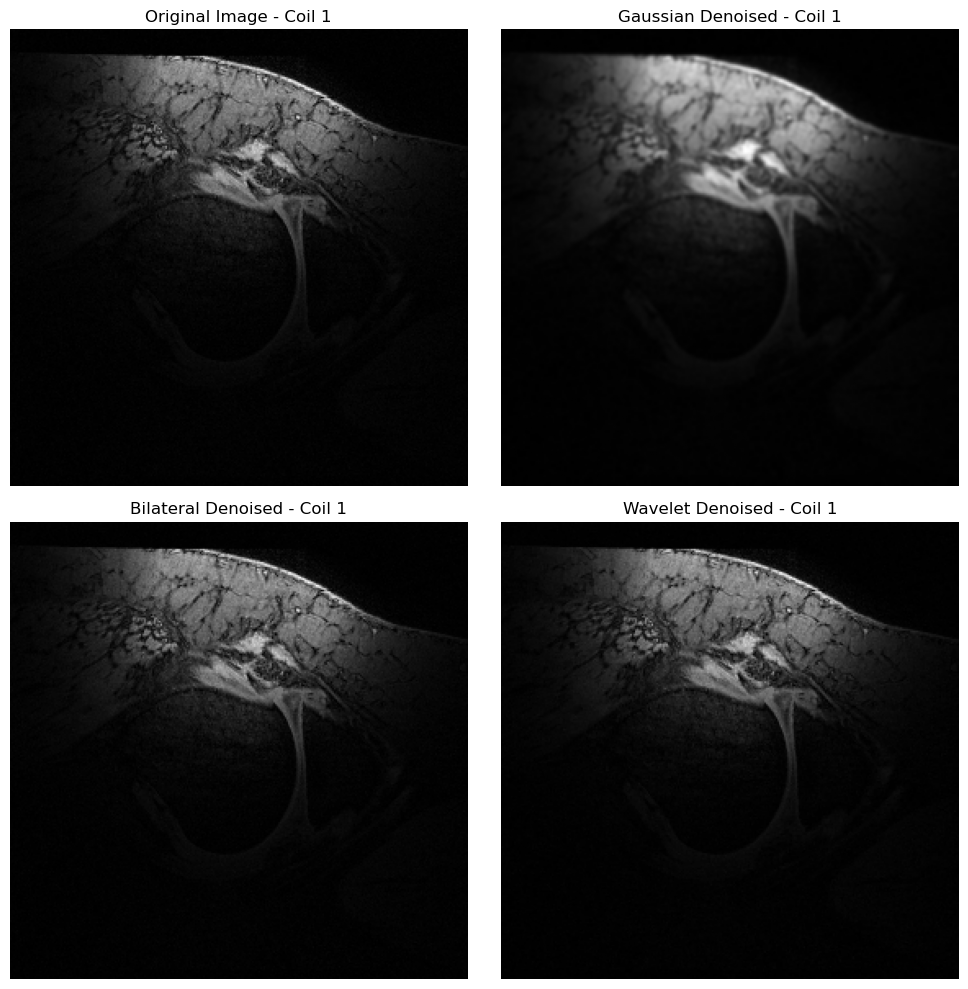

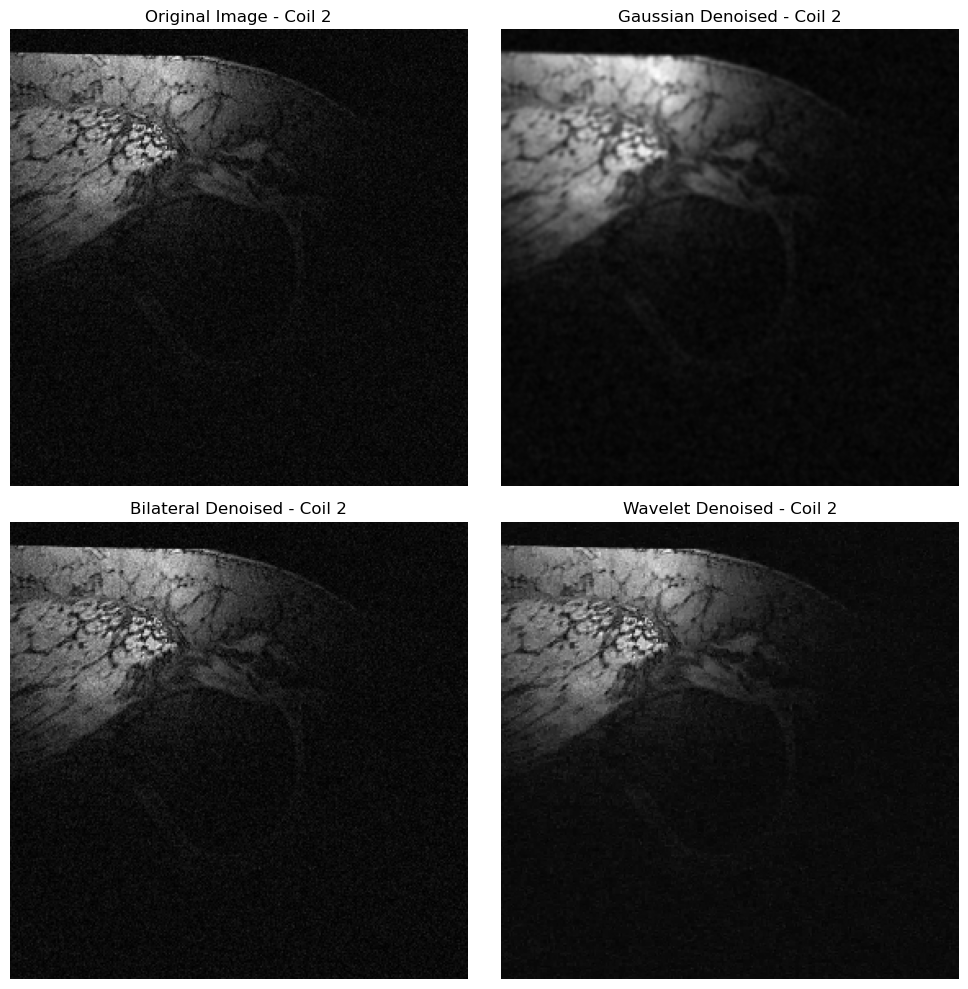

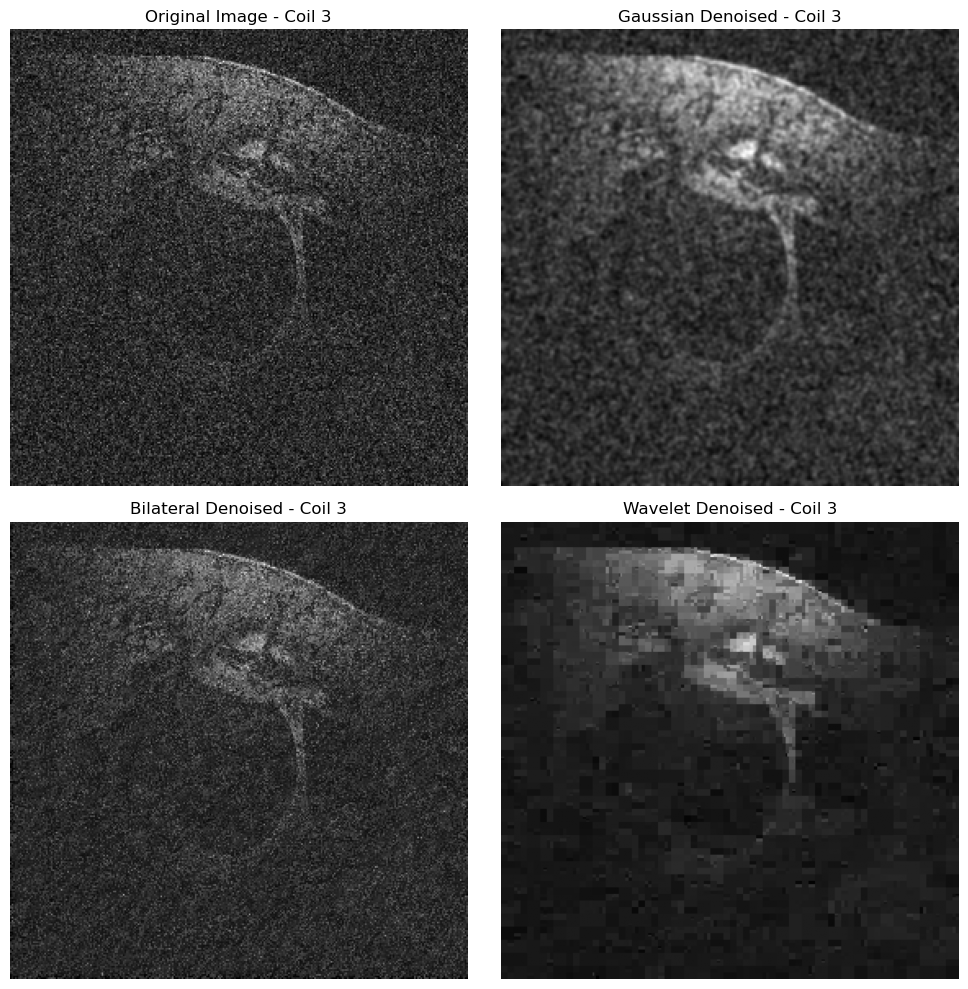

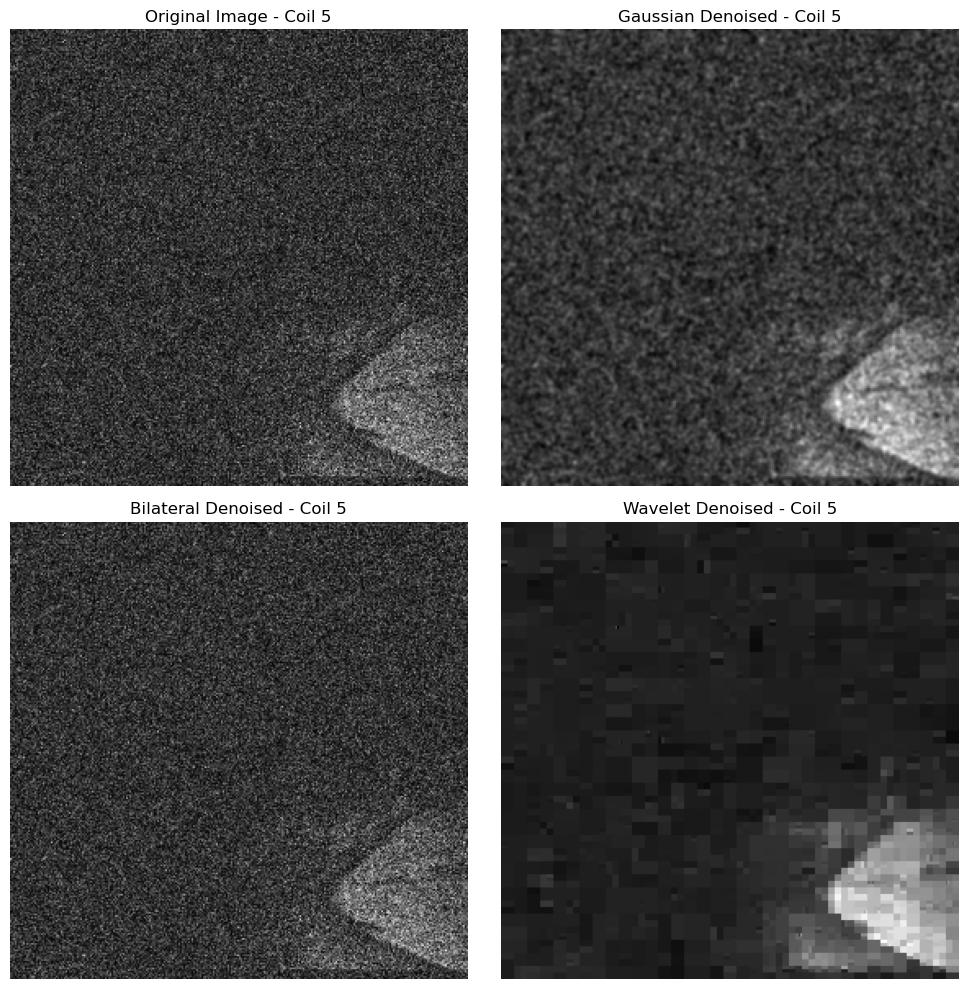

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage.restoration import denoise_bilateral, denoise_wavelet

kdata = np.load(data_path/"kspace.npy")

images = np.zeros_like(kdata, dtype=complex)
for i in range(kdata.shape[0]):
    images[i] = np.fft.ifft2(kdata[i])

magni = np.abs(images)

gaussian = np.zeros_like(magni)
bilateral = np.zeros_like(magni)
wavelet = np.zeros_like(magni)

for i in range(kdata.shape[0]):
    gaussian[i] = gaussian_filter(magni[i], sigma=1.0)
    bilateral[i] = denoise_bilateral(magni[i], sigma_color=0.1, sigma_spatial=1)
    wavelet[i] = denoise_wavelet(magni[i], method='BayesShrink', mode='soft')


coils_to_show = [0, 1, 2, 4]   # skip broken coils 4 and 6

for coil_idx in coils_to_show:
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    
    # original image
    axes[0, 0].imshow(magni[coil_idx], cmap='gray')
    axes[0, 0].set_title(f'Original Image - Coil {coil_idx+1}')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(gaussian[coil_idx], cmap='gray')
    axes[0, 1].set_title(f'Gaussian Denoised - Coil {coil_idx+1}')
    axes[0, 1].axis('off')
    
    axes[1, 0].imshow(bilateral[coil_idx], cmap='gray')
    axes[1, 0].set_title(f'Bilateral Denoised - Coil {coil_idx+1}')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(wavelet[coil_idx], cmap='gray')
    axes[1, 1].set_title(f'Wavelet Denoised - Coil {coil_idx+1}')
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()


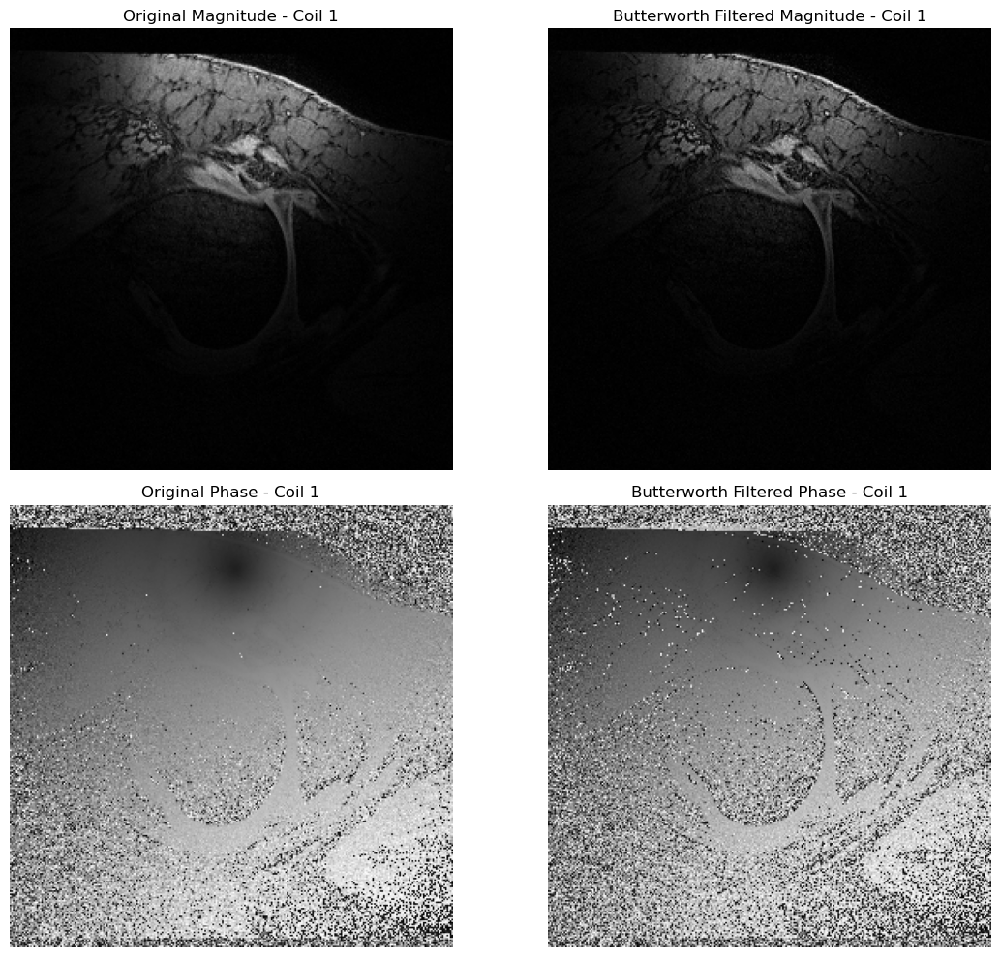

In [9]:
from a2cw import butterworth_lowpass_filter

coil_idx = 0
filtered_k = kdata[coil_idx] * butterworth_lowpass_filter(kdata[coil_idx].shape, D0=220, n=2)

# convey to image space
filtered_im = np.fft.ifft2(filtered_k)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(magni[coil_idx], cmap='gray')
axes[0, 0].set_title('Original Magnitude - Coil 1')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.abs(filtered_im), cmap='gray')
axes[0, 1].set_title('Butterworth Filtered Magnitude - Coil 1')
axes[0, 1].axis('off')

axes[1, 0].imshow(np.angle(images[coil_idx]), cmap='gray')
axes[1, 0].set_title('Original Phase - Coil 1')
axes[1, 0].axis('off')

axes[1, 1].imshow(np.angle(filtered_im), cmap='gray')
axes[1, 1].set_title('Butterworth Filtered Phase - Coil 1')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


#### Use wavelet method to recreate the new combined image.

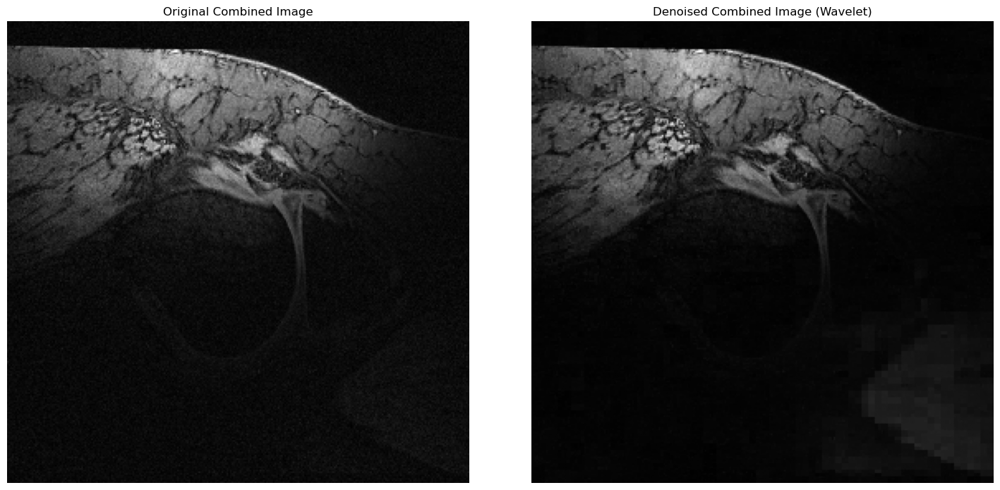

In [18]:
from a2cw import s_n_masks

## --------- get the SNRs for combination coefficients --------- ##
snr = []
for i in range(kdata.shape[0]):
    s_mask, n_mask = s_n_masks(wavelet[i])

    signal = np.mean(wavelet[i][s_mask])
    noise = np.std(wavelet[i][n_mask])
    snr.append(signal/noise)

    if i == 3 or i ==5:  # set coils 4 and 6's coefficients to 0
        snr[-1] = 0

norm_snr = snr / sum(snr)

## --------- combine with normalised SNRs --------- ##
denoised_combined = np.zeros(wavelet.shape[1:])

for i in range(kdata.shape[0]):
    denoised_combined += (norm_snr[i] * wavelet[i])**2

# combine
denoised_combined = np.sqrt(denoised_combined)

original_combined = np.zeros(magni.shape[1:])
for i in range(kdata.shape[0]):
    if i not in [3, 5]: 
        original_combined += magni[i]**2
original_combined = np.sqrt(original_combined)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))

axes[0].imshow(original_combined, cmap='gray')
axes[0].set_title('Original Combined Image')
axes[0].axis('off')

axes[1].imshow(denoised_combined, cmap='gray')
axes[1].set_title('Denoised Combined Image (Wavelet)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [22]:
from a2cw import eval_denois, s_n_masks

s_mask, n_mask = s_n_masks(denoised_combined)
results = eval_denois(original_combined, denoised_combined, noise_region=n_mask, signal_region=s_mask)
print(f"The original SNR is:{results['Original_SNR']}\nThe Denoised SNR is:{results['Denoised_SNR']}\nThe improvement is:{results['SNR_Improvement']}.")

The original SNR is:16.03061764202444
The Denoised SNR is:22.173090240832845
The improvement is:1.3831712998197805.


Evaluate and compare the denoising results.

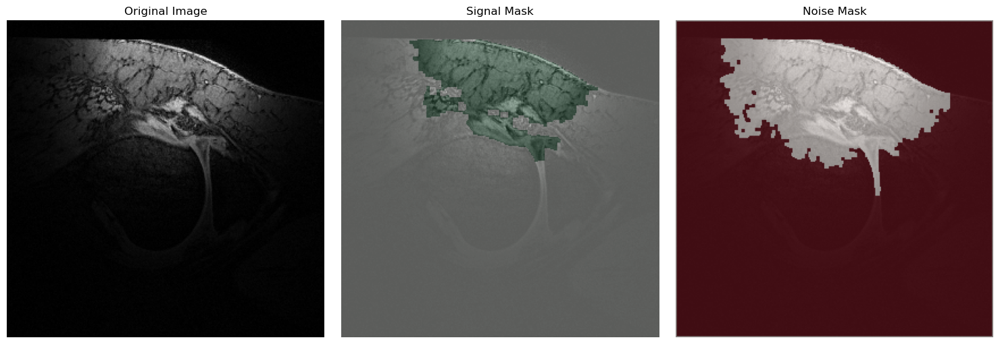

c:\Users\X13\.conda\envs\a2cw\lib\site-packages\skimage\metrics\simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


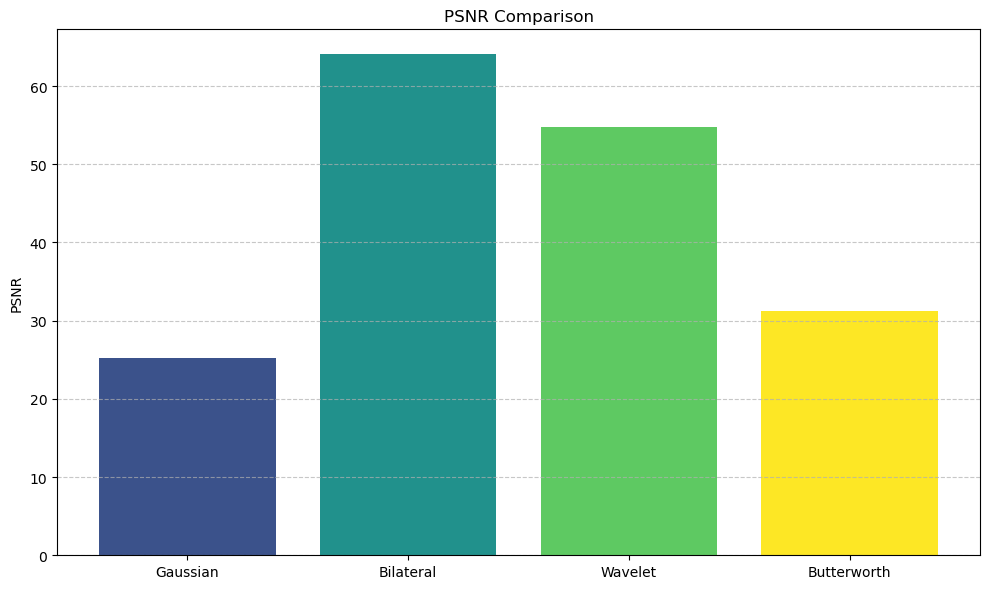

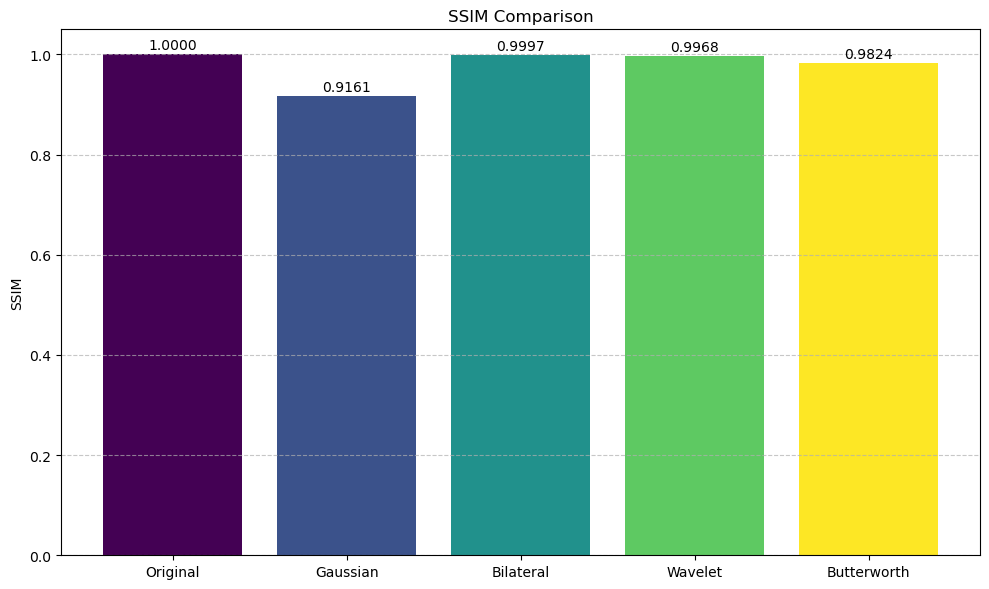

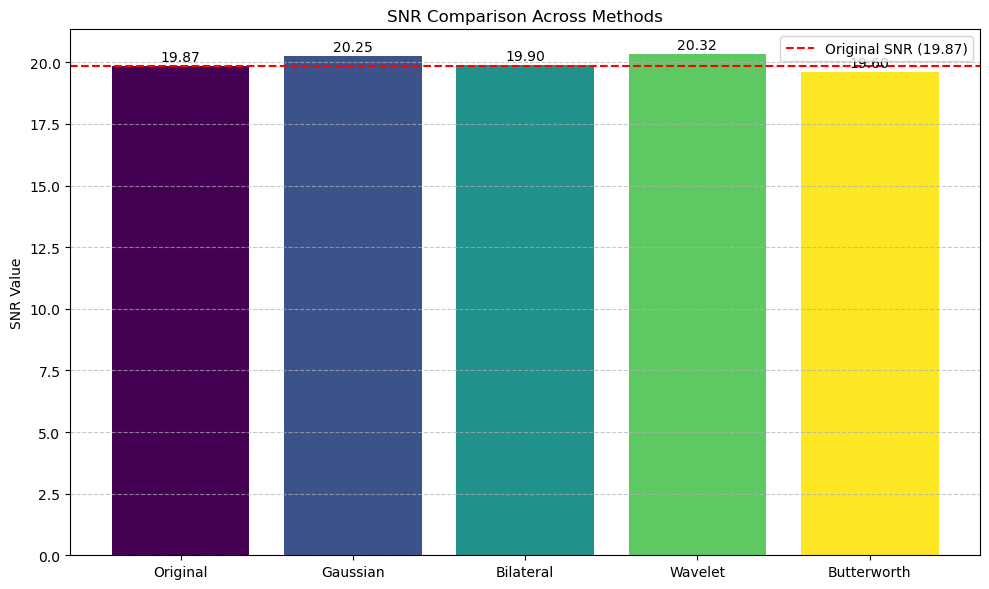

In [20]:
from a2cw import visual_masks, s_n_masks, compare_methods

# choose the first coil to analyse
signal_mask, noise_mask = s_n_masks(magni[0])  # create masks for signal and noise regions
visual_masks(magni[0], signal_mask, noise_mask)

deno_methods = {
    'Original': magni[0],
    'Gaussian': gaussian[0],
    'Bilateral': bilateral[0],
    'Wavelet': wavelet[0]
}

if 'filtered_im' in locals():
    deno_methods['Butterworth'] = np.abs(filtered_im)

evaluation_results = compare_methods(
    magni[0], 
    deno_methods,    
    noise_mask,          
    signal_mask   
)


In [21]:
import pandas as pd
pd.set_option('display.width', 150)
pd.set_option('display.max_columns', None) 

results_df = pd.DataFrame({method: {metric: value for metric, value in metrics.items()} 
                           for method, metrics in evaluation_results.items()})
print(results_df.T) 

                      MSE       PSNR      SSIM  Original_SNR  Denoised_SNR  SNR_Improvement
Original     0.000000e+00        inf  1.000000     19.868162     19.868162         1.000000
Gaussian     2.968344e-03  25.274857  0.916051     19.868162     20.250682         1.019253
Bilateral    3.941642e-07  64.043229  0.999699     19.868162     19.896668         1.001435
Wavelet      3.384665e-06  54.704843  0.996776     19.868162     20.324122         1.022949
Butterworth  7.421393e-04  31.295146  0.982388     19.868162     19.595252         0.986264
